In [39]:
import warnings
warnings.filterwarnings("ignore")
from numpy import asarray
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import glob
import os 
import random
import subprocess
import matplotlib.pyplot as plt
from skimage.io import imread
from matplotlib.patches import Rectangle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, Input, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

In [41]:
# Loading and Organizing Images from Local Directories
import os
from PIL import Image

other_activity_images = []
safe_driving_images = []
phone_talking_images = []
phone_texting_images = []
turning_images = []

base_path = "C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes"

for folder, image_list in zip(["other_activities", "safe_driving", "talking_phone", "texting_phone", "turning"], [other_activity_images, safe_driving_images, phone_talking_images, phone_texting_images, turning_images]):
    folder_path = os.path.join(base_path, folder)
    if os.path.exists(folder_path):
        for image_name in os.listdir(folder_path):
            if image_name.endswith(".png") or image_name.endswith(".jpg"):
                image_path = os.path.join(folder_path, image_name)
                image_list.append(image_path)
                print(image_path)
    else:
        print(f"Warning: Folder not found at {folder_path}")

C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-05-13.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-06-20.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-06-37.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-06-59.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-07-58.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-08-09.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-08-22.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-08-44.png
C:/Users/ARSHAD/Desktop/archive/Revitsone-5classes/Revitsone-5classes\other_activities\2019-04-2416-33-00.png
C:/Users/A

In [43]:
font = {'family': 'Arial', 'color': '#2e3b4e'}
background_color = '#d3e0ea'


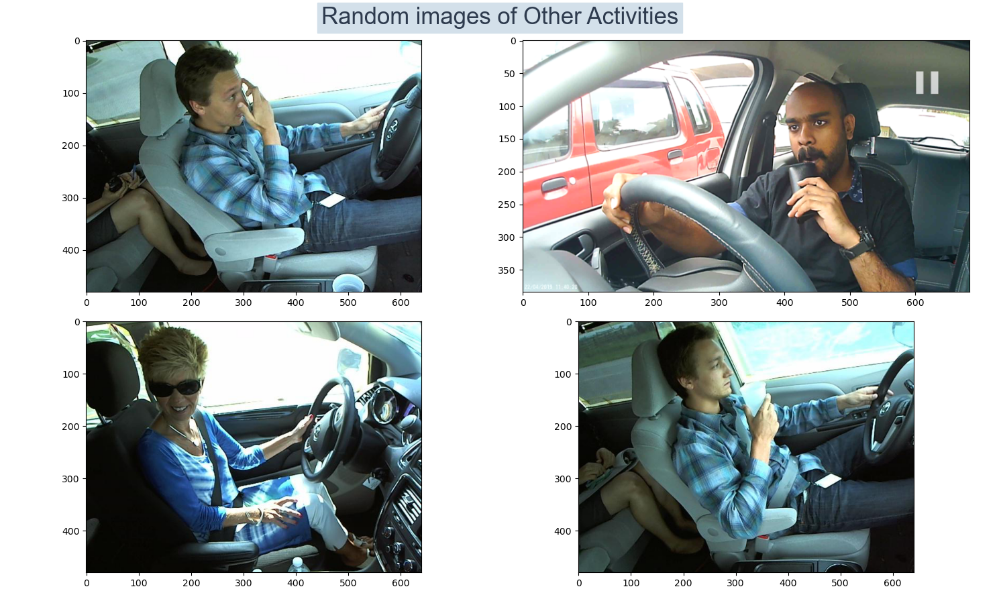

In [45]:
# Showing Random Images of Other Activities
plt.figure(figsize=(15, 9))
plt.axis('off')
for i in range(4):
    random_img = random.choice(other_activity_images)
    imgs = imread(random_img)
    plt.suptitle("Random images of Other Activities", fontdict=font, fontsize=25, backgroundcolor=background_color)
    plt.subplot(2, 2, i + 1)
    plt.imshow(imgs)
plt.tight_layout()
plt.show()


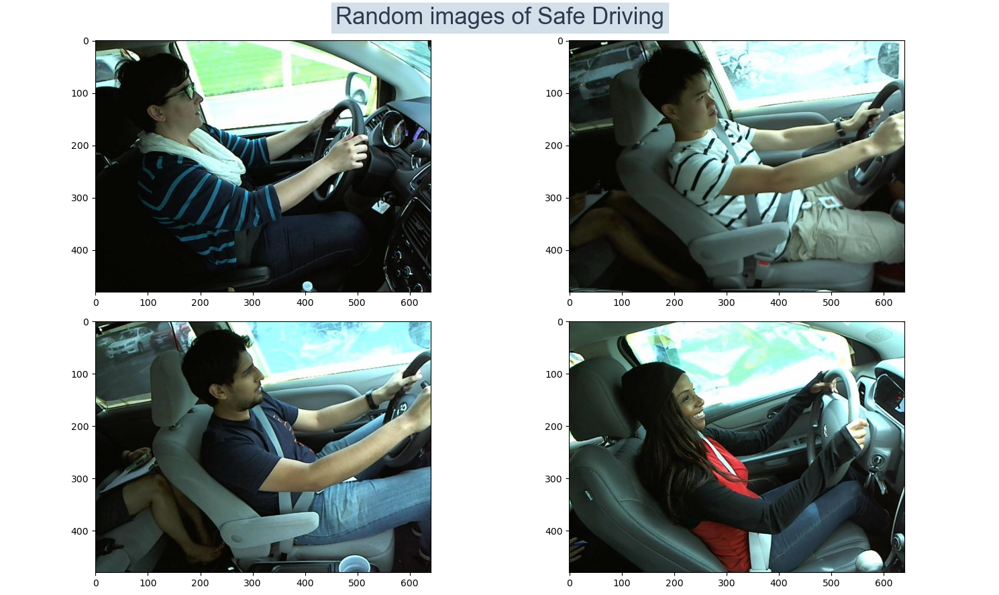

In [46]:
# Showing Random Images of Safe Driving
plt.figure(figsize=(15, 9))
plt.axis('off')
for i in range(4):
    random_img = random.choice(safe_driving_images)
    imgs = imread(random_img)
    plt.suptitle("Random images of Safe Driving", fontdict=font, fontsize=25, backgroundcolor=background_color)
    plt.subplot(2, 2, i + 1)
    plt.imshow(imgs)
plt.tight_layout()
plt.show()

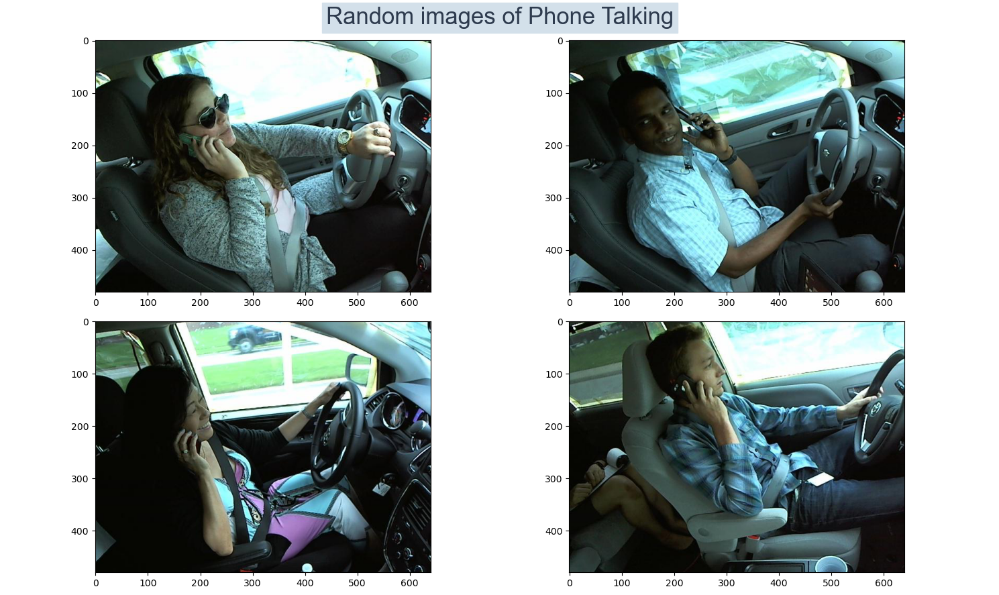

In [47]:
# Showing Random Images of Phone Talking
plt.figure(figsize=(15, 9))
plt.axis('off')
for i in range(4):
    random_img = random.choice(phone_talking_images)
    imgs = imread(random_img)
    plt.suptitle("Random images of Phone Talking", fontdict=font, fontsize=25, backgroundcolor=background_color)
    plt.subplot(2, 2, i + 1)
    plt.imshow(imgs)
plt.tight_layout()
plt.show()

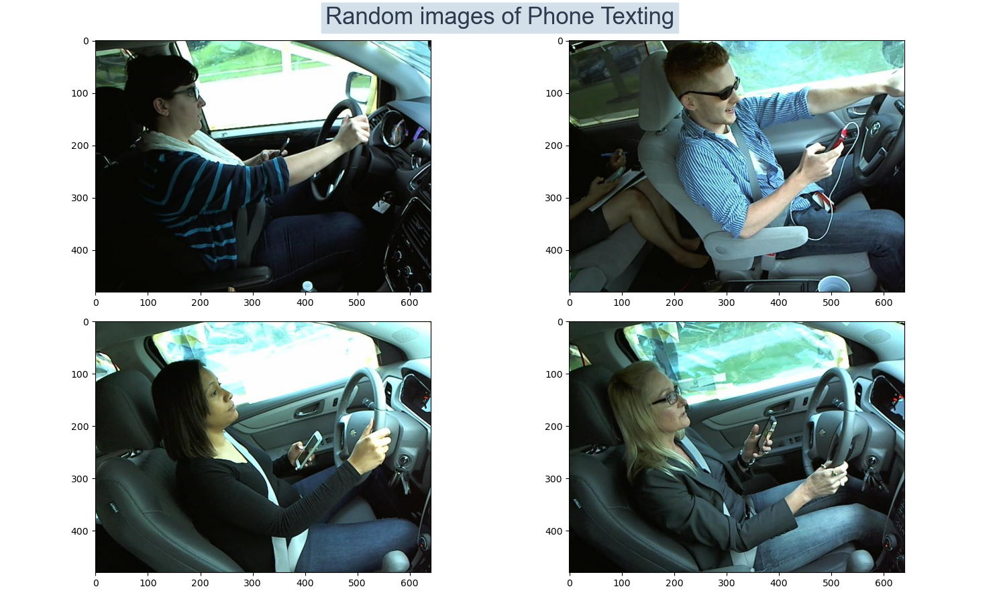

In [48]:
# Showing Random Images of Phone Texting
plt.figure(figsize=(15, 9))
plt.axis('off')
for i in range(4):
    random_img = random.choice(phone_texting_images)
    imgs = imread(random_img)
    plt.suptitle("Random images of Phone Texting", fontdict=font, fontsize=25, backgroundcolor=background_color)
    plt.subplot(2, 2, i + 1)
    plt.imshow(imgs)
plt.tight_layout()
plt.show()


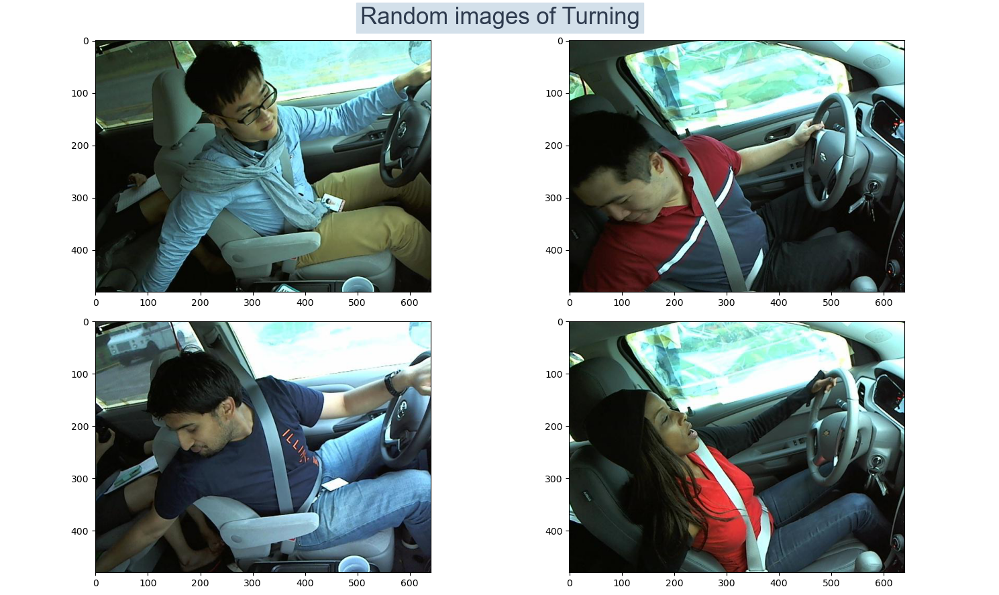

In [49]:
# Showing Random Images of Turning
plt.figure(figsize=(15, 9))
plt.axis('off')
for i in range(4):
    random_img = random.choice(turning_images)
    imgs = imread(random_img)
    plt.suptitle("Random images of Turning", fontdict=font, fontsize=25, backgroundcolor=background_color)
    plt.subplot(2, 2, i + 1)
    plt.imshow(imgs)
plt.tight_layout()
plt.show()

In [50]:
# Data Descriptives
print("Number of images in each category:")
print("Number of samples in (Class = Other) =", len(other_activity_images))
print("Number of samples in (Class = Safe Driving) =", len(safe_driving_images))
print("Number of samples in (Class = Talking Phone) =", len(phone_talking_images))
print("Number of samples in (Class = Texting Phone) =", len(phone_texting_images))
print("Number of samples in (Class = Turning) =", len(turning_images))


Number of images in each category:
Number of samples in (Class = Other) = 2119
Number of samples in (Class = Safe Driving) = 2203
Number of samples in (Class = Talking Phone) = 2169
Number of samples in (Class = Texting Phone) = 2203
Number of samples in (Class = Turning) = 2057


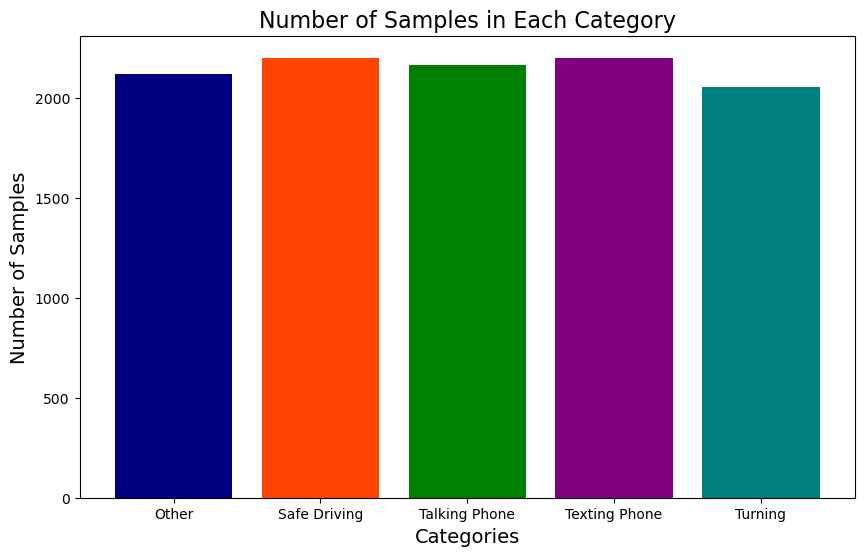

In [52]:
# Plotting the number of samples in each class
categories = ['Other', 'Safe Driving', 'Talking Phone', 'Texting Phone', 'Turning']
counts = [len(other_activity_images), len(safe_driving_images), len(phone_talking_images), len(phone_texting_images), len(turning_images)]

plt.figure(figsize=(10, 6))
plt.bar(categories, counts, color=['navy', 'orangered', 'green', 'purple', 'teal'])
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.title('Number of Samples in Each Category', fontsize=16)
plt.show()

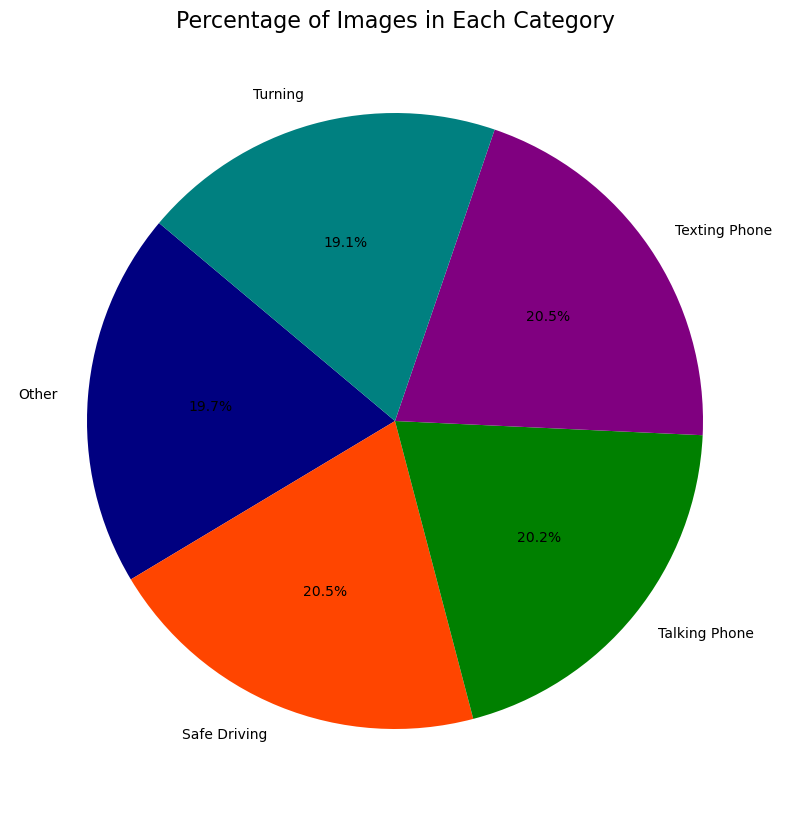

In [53]:
# Plotting the number of images per category as a pie chart
plt.figure(figsize=(10, 10))
plt.pie(counts, labels=categories, autopct='%1.1f%%', colors=['navy', 'orangered', 'green', 'purple', 'teal'], startangle=140)
plt.title('Percentage of Images in Each Category', fontsize=16)
plt.show()


In [61]:
# Splitting Data into Train, Test, and Validation Sets
print("Train", "Test", "Valid")

print(.8 * len(other_activity_images), .1 * len(other_activity_images), .1 * len(other_activity_images))
print(.8 * len(safe_driving_images), .1 * len(safe_driving_images), .1 * len(safe_driving_images))
print(.8 * len(phone_talking_images), .1 * len(phone_talking_images), .1 * len(phone_talking_images))
print(.8 * len(phone_texting_images), .1 * len(phone_texting_images), .1 * len(phone_texting_images))
print(.8 * len(turning_images), .1 * len(turning_images), .1 * len(turning_images))


Train Test Valid
1695.2 211.9 211.9
1762.4 220.3 220.3
1735.2 216.9 216.9
1762.4 220.3 220.3
1645.6000000000001 205.70000000000002 205.70000000000002


In [63]:
# Splitting Data into Train, Test, and Validation Sets
print("Train", "Test", "Valid")

train_other = other_activity_images[:1695]
test_other = other_activity_images[1695:1907]
valid_other = other_activity_images[1907:]
print(len(train_other), len(test_other), len(valid_other))

train_safe = safe_driving_images[:1762]
test_safe = safe_driving_images[1762:1982]
valid_safe = safe_driving_images[1982:]
print(len(train_safe), len(test_safe), len(valid_safe))

train_talking = phone_talking_images[:1735]
test_talking = phone_talking_images[1735:1951]
valid_talking = phone_talking_images[1951:]
print(len(train_talking), len(test_talking), len(valid_talking))

train_text = phone_texting_images[:1762]
test_text = phone_texting_images[1762:1982]
valid_text = phone_texting_images[1982:]
print(len(train_text), len(test_text), len(valid_text))

train_turn = turning_images[:1645]
test_turn = turning_images[1645:1851]
valid_turn = turning_images[1851:]
print(len(train_turn), len(test_turn), len(valid_turn))


Train Test Valid
1695 212 212
1762 220 221
1735 216 218
1762 220 221
1645 206 206


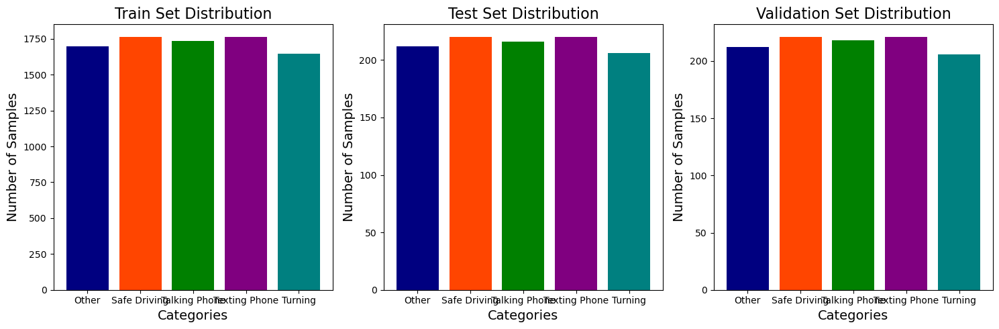

In [65]:
# Train, Test, Validation counts for each category after splitting
categories = ['Other', 'Safe Driving', 'Talking Phone', 'Texting Phone', 'Turning']
train_counts = [len(train_other), len(train_safe), len(train_talking), len(train_text), len(train_turn)]
test_counts = [len(test_other), len(test_safe), len(test_talking), len(test_text), len(test_turn)]
valid_counts = [len(valid_other), len(valid_safe), len(valid_talking), len(valid_text), len(valid_turn)]

# Plotting bar graphs
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.bar(categories, train_counts, color=['navy', 'orangered', 'green', 'purple', 'teal'])
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.title('Train Set Distribution', fontsize=16)

plt.subplot(1, 3, 2)
plt.bar(categories, test_counts, color=['navy', 'orangered', 'green', 'purple', 'teal'])
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.title('Test Set Distribution', fontsize=16)

plt.subplot(1, 3, 3)
plt.bar(categories, valid_counts, color=['navy', 'orangered', 'green', 'purple', 'teal'])
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.title('Validation Set Distribution', fontsize=16)

plt.tight_layout()
plt.show()


In [43]:
train_other_df = pd.DataFrame({'image':train_other, 'label':'Other'})
train_safe_df = pd.DataFrame({'image':train_safe, 'label':'Safe'})
train_talking_df = pd.DataFrame({'image':train_talking, 'label':'Talk'})
train_text_df = pd.DataFrame({'image':train_text, 'label':'Text'})
train_turn_df = pd.DataFrame({'image':train_turn, 'label':'Turn'})

In [45]:
test_other_df = pd.DataFrame({'image':test_other, 'label':'Other'})
test_safe_df = pd.DataFrame({'image':test_safe, 'label':'Safe'})
test_talking_df = pd.DataFrame({'image':test_talking, 'label':'Talk'})
test_text_df = pd.DataFrame({'image':test_text, 'label':'Text'})
test_turn_df = pd.DataFrame({'image':test_turn, 'label':'Turn'})

In [47]:
valid_other_df = pd.DataFrame({'image':valid_other, 'label':'Other'})
valid_safe_df = pd.DataFrame({'image':valid_safe, 'label':'Safe'})
valid_talking_df = pd.DataFrame({'image':valid_talking, 'label':'Talk'})
valid_text_df = pd.DataFrame({'image':valid_text, 'label':'Text'})
valid_turn_df = pd.DataFrame({'image':valid_turn, 'label':'Turn'})

In [49]:
train_df = pd.concat([train_other_df, train_safe_df, train_talking_df, train_text_df, train_turn_df])
test_df = pd.concat([test_other_df, test_safe_df, test_talking_df, test_text_df, test_turn_df])
val_df = pd.concat([valid_other_df, valid_safe_df, valid_talking_df, valid_text_df, valid_turn_df])

In [51]:
train_df.head()

,image,label
0,C:/Users/ARSHAD/Desktop/archive/Revitsone-5cla...,Other
1,C:/Users/ARSHAD/Desktop/archive/Revitsone-5cla...,Other
2,C:/Users/ARSHAD/Desktop/archive/Revitsone-5cla...,Other
3,C:/Users/ARSHAD/Desktop/archive/Revitsone-5cla...,Other
4,C:/Users/ARSHAD/Desktop/archive/Revitsone-5cla...,Other


In [53]:
print("Number of rows in train dataframe is: ", len(train_df))
print("Number of rows in test dataframe is: ", len(test_df))
print("Number of rows in val dataframe is: ", len(val_df))

Number of rows in train dataframe is:  8599
Number of rows in test dataframe is:  1074
Number of rows in val dataframe is:  1078


In [55]:
random_img_height = random.choice(train_other)

In [57]:
image= cv2.imread(random_img_height)

height, width= image.shape[:2]

print("The height is ", height)

print("The width is ", width)

The height is  480
The width is  640


In [59]:
Batch_size = 64
Img_height = 240
Img_width = 240

In [61]:
trainGenerator = ImageDataGenerator(rescale=1./255.)
valGenerator = ImageDataGenerator(rescale=1./255.)
testGenerator = ImageDataGenerator(rescale=1./255.)

In [63]:
trainDataset = trainGenerator.flow_from_dataframe(
  dataframe=train_df,
  class_mode="categorical",
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width) #set the height and width of the images
)

testDataset = testGenerator.flow_from_dataframe(
  dataframe=test_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width)
)

valDataset = valGenerator.flow_from_dataframe(
  dataframe=val_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width)
)

Found 8599 validated image filenames belonging to 5 classes.
Found 1074 validated image filenames belonging to 5 classes.
Found 1078 validated image filenames belonging to 5 classes.


In [68]:
# AlexNet Model
def AlexNet():
    inp = layers.Input((240, 240, 3))
    x = layers.Conv2D(96, 11, 4, activation='relu')(inp)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Conv2D(256, 5, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Conv2D(384, 3, 1, activation='relu')(x)
    x = layers.Conv2D(384, 3, 1, activation='relu')(x)
    x = layers.Conv2D(256, 3, 1, activation='relu')(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(2048, activation='relu')(x)  # Reduced from 4096 to improve efficiency
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(2048, activation='relu')(x)  # Reduced from 4096 to improve efficiency
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(5, activation='softmax')(x)

    model_Alex = models.Model(inputs=inp, outputs=x)

    return model_Alex

model_Alex = AlexNet()
model_Alex.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 58, 58, 96)          │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 58, 58, 96)          │             384 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 28, 28, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 24, 24, 256)         │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 24, 24, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 11, 11, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 9, 9, 384)           │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 7, 7, 384)           │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 5, 5, 256)           │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2048)                │       2,099,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 2048)                │       4,196,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │          10,245 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,054,405 (38.35 MB)

 Trainable params: 10,053,701 (38.35 MB)

 Non-trainable params: 704 (2.75 KB)

In [71]:
tf.keras.utils.plot_model(
    model_Alex,
    to_file='alex_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

model_Alex.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

Alex_model = model_Alex.fit(trainDataset, epochs=20, validation_data=valDataset)

Epoch 1/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 213s 1s/step - accuracy: 0.3208 - loss: 0.6650 - val_accuracy: 0.4842 - val_loss: 0.4246
Epoch 2/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 116s 840ms/step - accuracy: 0.7287 - loss: 0.2532 - val_accuracy: 0.6948 - val_loss: 0.2955
Epoch 3/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 118s 856ms/step - accuracy: 0.8772 - loss: 0.1318 - val_accuracy: 0.8748 - val_loss: 0.1560
Epoch 4/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 117s 848ms/step - accuracy: 0.9197 - loss: 0.0938 - val_accuracy: 0.9249 - val_loss: 0.0857
Epoch 5/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 116s 836ms/step - accuracy: 0.9307 - loss: 0.0810 - val_accuracy: 0.9527 - val_loss: 0.0530
Epoch 6/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 116s 840ms/step - accuracy: 0.9598 - loss: 0.0462 - val_accuracy: 0.8813 - val_loss: 0.1409
Epoch 7/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 116s 838ms/step - accuracy: 0.9545 - loss: 0.0516 - val_accuracy: 0.9657 - val_loss: 0.0491
Epoch 8/20
135/135 ━━━━━━━━━━━━━━━━━━━━ 116s 838ms/step - accuracy: 0.9631 - lo

In [73]:
training_loss_alex = Alex_model.history['loss']
val_loss_alex = Alex_model.history['val_loss']
training_acc_alex = Alex_model.history['accuracy']
val_acc_alex = Alex_model.history['val_accuracy']

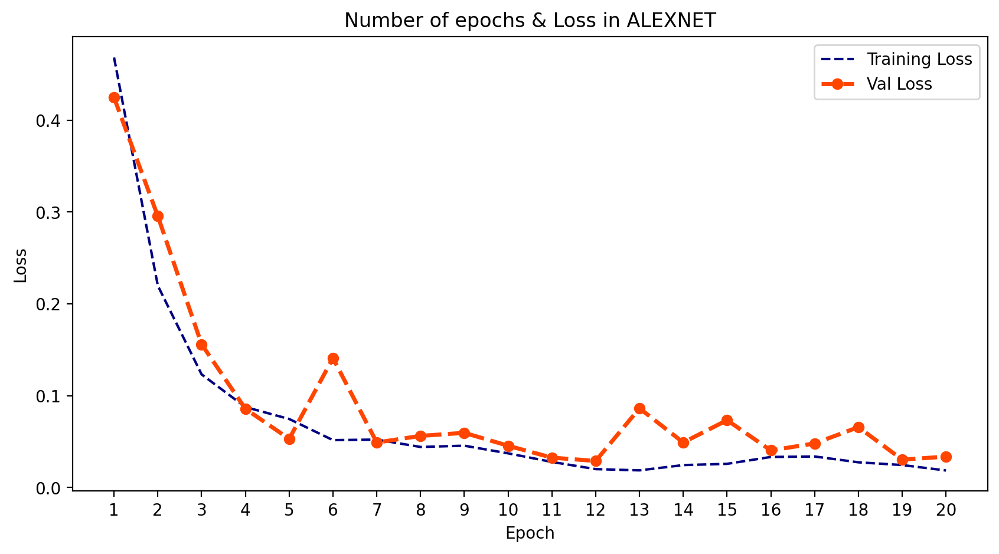

In [75]:
epoch_count = range(1, len(training_loss_alex) + 1)

# Visualize loss history
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_alex, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_alex, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in ALEXNET')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

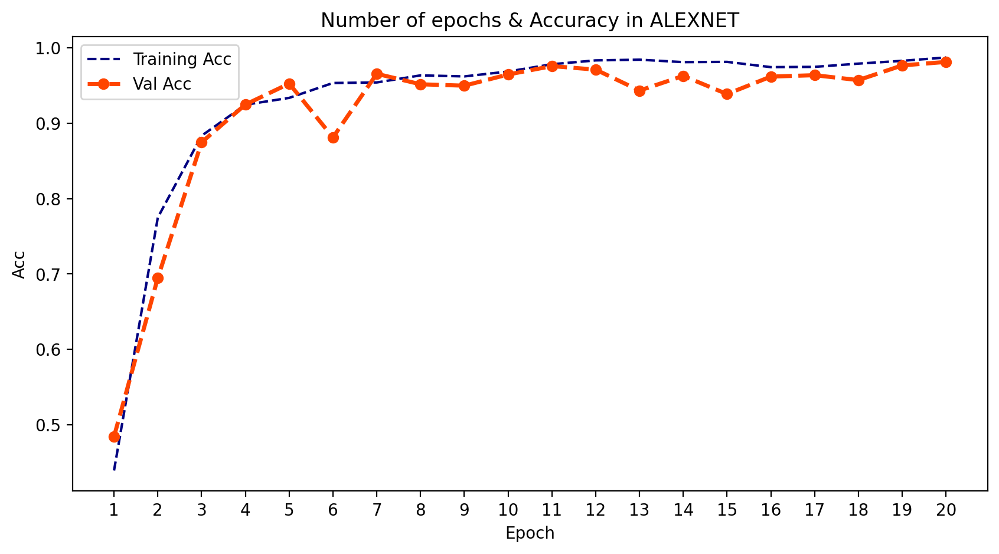

In [77]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_alex, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_alex, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in ALEXNET')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

In [87]:
def ResNet34():
    inp = layers.Input((240, 240, 3))
    x = layers.Conv2D(64, 7, 2, padding='valid', activation='relu')(inp)
    x = layers.MaxPooling2D(strides=2, padding='same')(x)
    x = layers.Conv2D(64, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(128, 3, 2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(256, 3, 2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(512, 3, 2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(512, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(512, 3, 1, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(5, activation='softmax')(x)

    model_Res = models.Model(inputs=inp, outputs=x)

    return model_Res

model_Res = ResNet34()
model_Res.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_33 (Conv2D)                   │ (None, 117, 117, 64)        │           9,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 59, 59, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_34 (Conv2D)                   │ (None, 59, 59, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 59, 59, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_35 (Conv2D)                   │ (None, 59, 59, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 59, 59, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 59, 59, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 59, 59, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 59, 59, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 59, 59, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 30, 30, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_26               │ (None, 30, 30, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 30, 30, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_27               │ (None, 30, 30, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 30, 30, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_28               │ (None, 30, 30, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 30, 30, 128)         │         147,5

 Total params: 9,837,061 (37.53 MB)

 Trainable params: 9,829,381 (37.50 MB)

 Non-trainable params: 7,680 (30.00 KB)

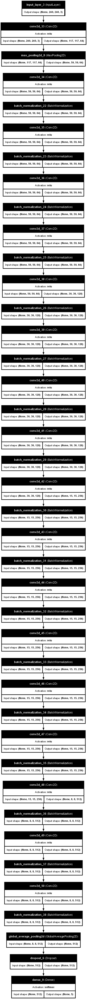

In [89]:
tf.keras.utils.plot_model(
    model_Res,
    to_file='res_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)




In [91]:
model_Res.compile(loss=BinaryCrossentropy(),
                  optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

RES_model = model_Res.fit(trainDataset, epochs=10, validation_data=valDataset)


Epoch 1/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 387s 3s/step - accuracy: 0.4084 - loss: 0.6031 - val_accuracy: 0.2477 - val_loss: 2.3038
Epoch 2/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 367s 3s/step - accuracy: 0.8153 - loss: 0.1960 - val_accuracy: 0.3803 - val_loss: 1.7005
Epoch 3/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 366s 3s/step - accuracy: 0.9196 - loss: 0.0942 - val_accuracy: 0.7792 - val_loss: 0.3438
Epoch 4/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 367s 3s/step - accuracy: 0.9450 - loss: 0.0633 - val_accuracy: 0.6744 - val_loss: 0.4722
Epoch 5/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 366s 3s/step - accuracy: 0.9697 - loss: 0.0398 - val_accuracy: 0.8182 - val_loss: 0.2265
Epoch 6/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 366s 3s/step - accuracy: 0.9689 - loss: 0.0378 - val_accuracy: 0.8831 - val_loss: 0.2216
Epoch 7/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 365s 3s/step - accuracy: 0.9757 - loss: 0.0278 - val_accuracy: 0.9453 - val_loss: 0.0741
Epoch 8/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 365s 3s/step - accuracy: 0.9814 - loss: 0.0212 - val_accu

In [98]:

training_loss_res = RES_model.history['loss']
val_loss_res = RES_model.history['val_loss']
training_acc_res = RES_model.history['accuracy']
val_acc_res = RES_model.history['val_accuracy']


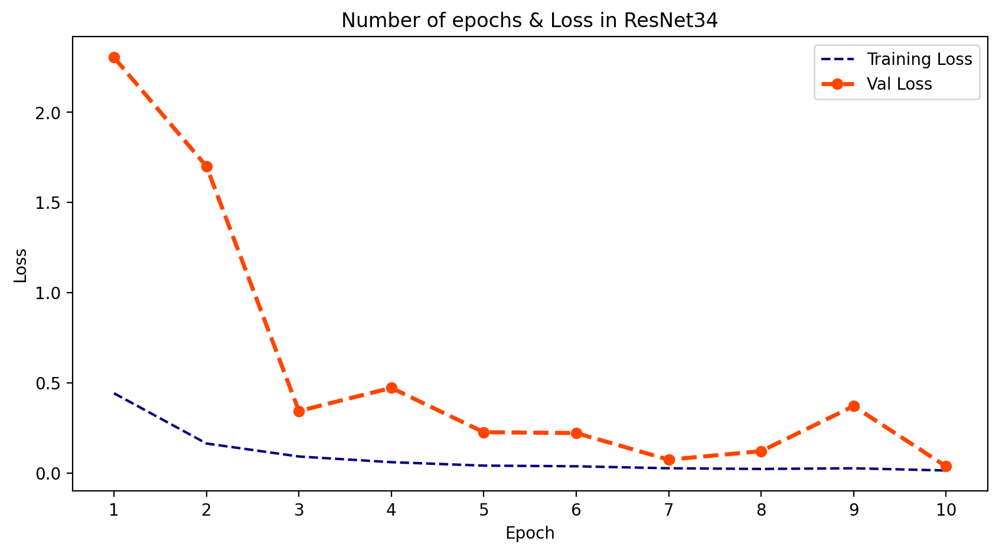

In [104]:
plt.figure(figsize=(10, 5), dpi=200)
epoch_count = np.arange(1, len(training_loss_res) + 1)
plt.plot(epoch_count, training_loss_res, 'r--', color='navy')
plt.plot(epoch_count, val_loss_res, '--bo', color='orangered', linewidth='2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in ResNet34')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epoch_count)
plt.show();

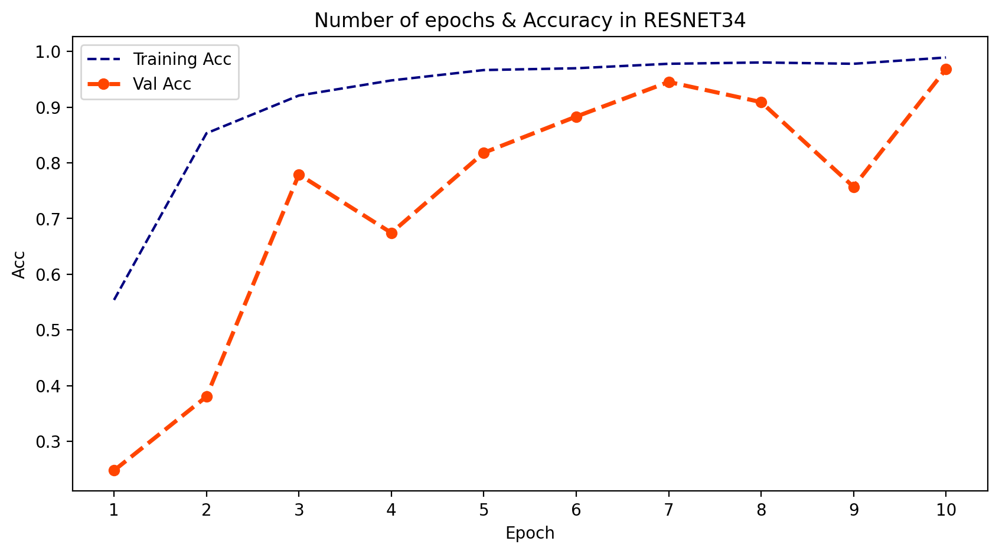

In [106]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_res, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_res, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in RESNET34')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

In [65]:
def VGGNet():
    inp = layers.Input((240, 240, 3))
    x = layers.Conv2D(32, 3, 1, activation='relu')(inp)
    x = layers.Conv2D(32, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Conv2D(64, 3, 1, activation='relu')(x)
    x = layers.Conv2D(64, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Conv2D(128, 3, 1, activation='relu')(x)
    x = layers.Conv2D(128, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(5, activation='softmax')(x)

    model_VGG = models.Model(inputs=inp, outputs=x)

    return model_VGG

model_VGG = VGGNet()
model_VGG.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 238, 238, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 236, 236, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 236, 236, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 118, 118, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 116, 116, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 114, 114, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 114, 114, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 57, 57, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 55, 55, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 53, 53, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 53, 53, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 512)                 │          66,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 356,517 (1.36 MB)

 Trainable params: 356,069 (1.36 MB)

 Non-trainable params: 448 (1.75 KB)

In [67]:
# Compile and Train the VGGNet Model
tf.keras.utils.plot_model(
    model_VGG,
    to_file='vgg_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

model_VGG.compile(loss=BinaryCrossentropy(),
                  optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

VGG_model = model_VGG.fit(trainDataset, epochs=10, validation_data=valDataset)

Epoch 1/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 511s 4s/step - accuracy: 0.3277 - loss: 0.4812 - val_accuracy: 0.1911 - val_loss: 0.5969
Epoch 2/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 494s 4s/step - accuracy: 0.7422 - loss: 0.2563 - val_accuracy: 0.2468 - val_loss: 0.7983
Epoch 3/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 489s 4s/step - accuracy: 0.9073 - loss: 0.1152 - val_accuracy: 0.2050 - val_loss: 1.3616
Epoch 4/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 478s 4s/step - accuracy: 0.9429 - loss: 0.0669 - val_accuracy: 0.4527 - val_loss: 0.4180
Epoch 5/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 471s 3s/step - accuracy: 0.9520 - loss: 0.0528 - val_accuracy: 0.6447 - val_loss: 0.4349
Epoch 6/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 466s 3s/step - accuracy: 0.9712 - loss: 0.0339 - val_accuracy: 0.6865 - val_loss: 0.4028
Epoch 7/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 466s 3s/step - accuracy: 0.9769 - loss: 0.0279 - val_accuracy: 0.6521 - val_loss: 0.5022
Epoch 8/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 465s 3s/step - accuracy: 0.9821 - loss: 0.0235 - val_accu

In [79]:
training_loss_vgg = VGG_model.history['loss']
val_loss_vgg = VGG_model.history['val_loss']
training_acc_vgg = VGG_model.history['accuracy']
val_acc_vgg = VGG_model.history['val_accuracy']

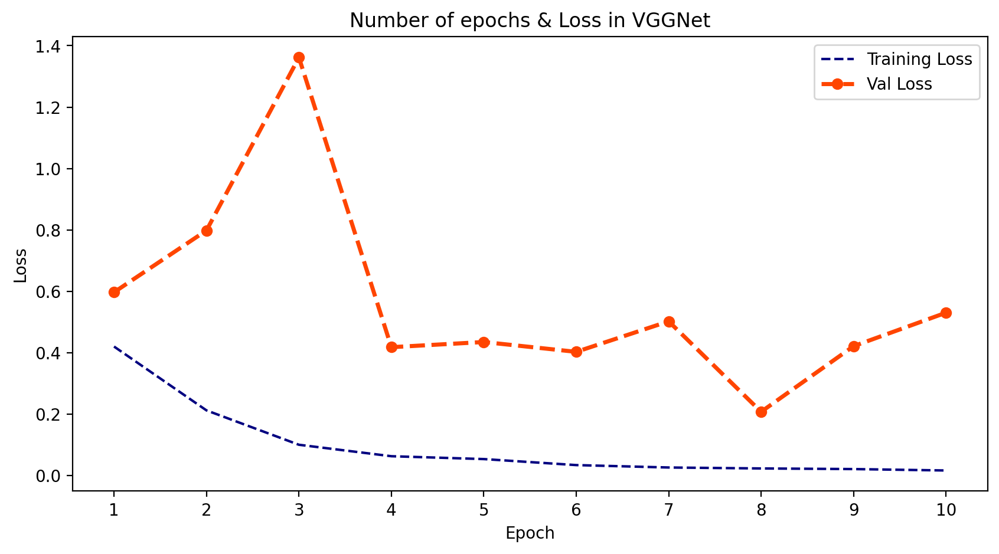

In [83]:
plt.figure(figsize=(10, 5), dpi=200)
epoch_count = np.arange(1, len(training_loss_vgg) + 1)
plt.plot(epoch_count, training_loss_vgg, 'r--', color='navy')
plt.plot(epoch_count, val_loss_vgg, '--bo', color='orangered', linewidth='2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in VGGNet')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epoch_count)
plt.show();


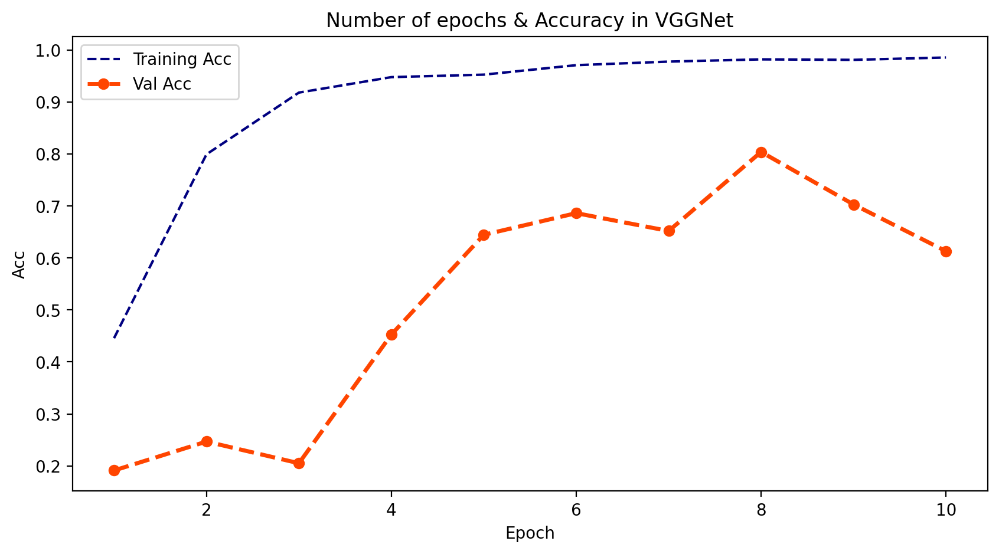

In [85]:
plt.figure(figsize=(10, 5), dpi=200)
plt.plot(epoch_count, training_acc_vgg, 'r--', color='navy')
plt.plot(epoch_count, val_acc_vgg, '--bo', color='orangered', linewidth='2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in VGGNet')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.plot();
plt.show();
